In [1]:
import pandas as pd
import numpy as np
import pickle

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.metrics import classification_report, roc_curve, auc
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix

from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection  import train_test_split

In [2]:
#df = pd.read_csv('data/Food_Inspections.csv')
df = pd.read_csv('data/input.csv')
df.columns = map(str.lower, df.columns)

# fill Nan with 0
df = df.fillna(0)

print(len(df))
print(df.info())
print(df.columns)
df.head(3)

23245
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23245 entries, 0 to 23244
Data columns (total 33 columns):
unnamed: 0                    23245 non-null int64
dba name_x                    23245 non-null object
aka name                      23245 non-null object
facility type                 23245 non-null object
risk                          23245 non-null object
address                       23245 non-null object
city                          23245 non-null object
state                         23245 non-null object
zip_x                         23245 non-null int64
inspection date               23245 non-null object
inspection type               23245 non-null object
results                       23245 non-null object
violations                    23245 non-null object
latitude                      23245 non-null float64
longitude                     23245 non-null float64
location                      23245 non-null object
historical wards 2003-2015    23245 non-null float64


,unnamed: 0,dba name_x,aka name,facility type,risk,address,city,state,zip_x,inspection date,...,conditional approval,application type,business activity,license code,legal name,full address,unnamed: 0.1,price_level,rating,user_ratings_total
0,0,PASTA AND BURGER SALON,PASTA AND BURGER SALON,restaurant,Risk 1 (High),1621 W 43RD ST,CHICAGO,IL,60609,05/25/2017,...,N,ISSUE,Sale of Food Prepared Onsite With Dining Area,1006,VISITA MARAVATIO INC.,"PASTA AND BURGER SALON,1621 W 43RD ST ,CHICAGO...",483,1.0,4.7,58.0
1,1,Q'BOLE TORTAS INC,Q'BOLE TORTAS,restaurant,Risk 1 (High),1621 W 43RD ST,CHICAGO,IL,60609,02/11/2016,...,N,ISSUE,Sale of Food Prepared Onsite With Dining Area,1006,VISITA MARAVATIO INC.,"Q'BOLE TORTAS INC,1621 W 43RD ST ,CHICAGO,IL,6...",1175,0.0,0.0,0.0
2,2,Q'BOLE TORTAS INC,Q'BOLE TORTAS,restaurant,Risk 1 (High),1621 W 43RD ST,CHICAGO,IL,60609,08/13/2015,...,N,ISSUE,Sale of Food Prepared Onsite With Dining Area,1006,VISITA MARAVATIO INC.,"Q'BOLE TORTAS INC,1621 W 43RD ST ,CHICAGO,IL,6...",1175,0.0,0.0,0.0


In [3]:
features = ['zip_x', 'inspection type', 'community areas', 
            'census tracts', 'wards', 'number violations', 
            'license description', 'conditional approval',
            'application type', 'license code']

features = ['latitude', 'longitude', 'number violations', 
            'price_level', 'rating', 'user_ratings_total',
            'license description', 'business activity', 
            'conditional approval', 'application type'] 


features = ['latitude', 'longitude', 'number violations', 'price_level', 'rating', 'user_ratings_total'] 

target = ['results']

x = df[features]
y = df[target]
y = y.replace('Pass w/ Conditions', 'Pass')

In [4]:
#y = y.replace('Fail', 0)
#y = y.replace('Pass w/ Conditions', 1)
#y = y.replace('Pass', 1)

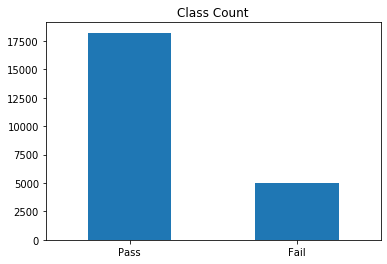

In [5]:
y['results'].value_counts().plot(kind='bar', title='Class Count', rot=0);

### Oversampling the minority class.

In [6]:
# Now add some random oversampling of the minority classes
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
#X_resampled, y_resampled = ros.fit_sample(x,y)
x, y = ros.fit_sample(x,y)

Using TensorFlow backend.
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [7]:
x = pd.DataFrame(data=x,
                 columns=features)

y = pd.DataFrame(data=y,
                 columns=target)

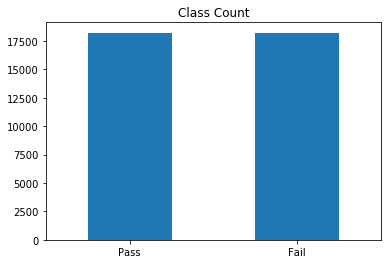

In [8]:
y['results'].value_counts().plot(kind='bar', title='Class Count', rot=0);

### SMOTE - Synthetic Minority Oversampling TEchnique

In [ ]:
from imblearn.over_sampling import SMOTE
X_smoted, y_smoted = SMOTE(random_state=42).fit_sample(x,y)

In [ ]:
x = pd.DataFrame(data=x,
                 columns=features)

y = pd.DataFrame(data=y,
                 columns=target)

In [ ]:
y['results'].value_counts().plot(kind='bar', title='Class Count', rot=0);

### ADASYN (ADAptive SYNthetic oversampling).

In [ ]:
from imblearn.over_sampling import ADASYN
x, y = ADASYN(random_state=42).fit_sample(x,y)

In [ ]:
x = pd.DataFrame(data=x,
                 columns=features)

y = pd.DataFrame(data=y,
                 columns=target)

In [ ]:
y['results'].value_counts().plot(kind='bar', title='Class Count', rot=0);

### Undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
x, y = RandomUnderSampler(random_state=42).fit_sample(x,y)

In [ ]:
x = pd.DataFrame(data=x,
                 columns=features)

y = pd.DataFrame(data=y,
                 columns=target)

In [ ]:
y['results'].value_counts().plot(kind='bar', title='Class Count', rot=0);

## dummy variable

In [ ]:
############ dummy 1 ############ 
x = pd.concat([x,pd.get_dummies(x['conditional approval'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
x = x.drop(['conditional approval'],axis=1)



############ dummy 2 ############ 
x = pd.concat([x,pd.get_dummies(x['application type'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
x = x.drop(['application type'],axis=1)



############ dummy 3 ############ 
x = pd.concat([x,pd.get_dummies(x['price_level'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
x = x.drop(['price_level'],axis=1)



############ dummy 4 ############ 
x = pd.concat([x,pd.get_dummies(x['license description'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
x = x.drop(['license description'],axis=1)



############ dummy 5 ############ 
x = pd.concat([x,pd.get_dummies(x['business activity'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
x = x.drop(['business activity'],axis=1)


In [ ]:
#x['user_ratings_total_2'] = x['user_ratings_total']**2
#x = x.drop(['user_ratings_total'], axis=1)

In [ ]:
#x = pd.concat([x,pd.get_dummies(x['business activity'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
#x = x.drop(['business activity'],axis=1)

#x = pd.concat([x,pd.get_dummies(x['license description'], drop_first=True)],axis=1)

# now drop the original 'license description'column (you don't need it anymore)
#x = x.drop(['license description'],axis=1)

In [6]:
x.shape

(23245, 6)

In [6]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state=4444)

In [7]:
len(y_train)

16271

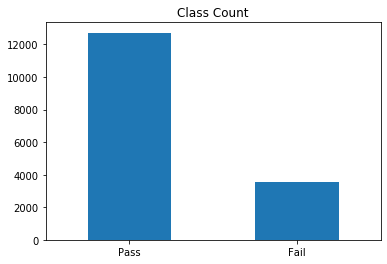

In [8]:
y_train['results'].value_counts().plot(kind='bar', title='Class Count', rot=0);

In [15]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
x_train, y_train = ros.fit_sample(x_train,y_train)

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [27]:
len(y_train)
len([i for i in y_train if i == 'Pass' ]), len([i for i in y_train if i == 'Fail' ])

(12720, 12720)

In [28]:
x_train.shape[0], x_test.shape[0]

(25440, 6974)

## Select models

In [9]:
k_neighbors = range(1,15,1)

knn_accuracy = []

for k in k_neighbors:
    knn = KNeighborsClassifier(k)
    knn.fit(x_train, y_train)
    score = accuracy_score(y_test, knn.predict(x_test))
    print(score)
    knn_accuracy.append(score)

best_k = knn_accuracy.index(max(knn_accuracy)) + 1  
max(knn_accuracy), knn_accuracy.index(max(knn_accuracy)) + 1   

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8147404645827359


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.7707198164611414


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8111557212503585


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.7902208201892744


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8137367364496702


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.7971035273874391


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8111557212503585


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.801548609119587


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8123028391167192


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8080011471178664


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.812016059650129


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8097218239174075


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8118726699168339


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  import sys


0.8087180957843418


(0.8147404645827359, 1)

In [10]:
learning_rates = np.arange(0.05, 2, 0.05)#[0.05, 0.1, 0.25, 0.5, 0.75, 1]

gb_accuracy = [] 

for learning_rate in learning_rates:
    gb = GradientBoostingClassifier(n_estimators=20, learning_rate = learning_rate, max_features=2, max_depth = 2, random_state = 0)
    gb.fit(x_train, y_train)
    score = accuracy_score(y_test, gb.predict(x_test))
    print("Learning rate: {} and Accuracy score : {}".format(learning_rate, score) )
    gb_accuracy.append(score)

best_learning_rate = learning_rates[np.argmax(np.array(gb_accuracy))]
max(gb_accuracy), learning_rates[np.argmax(np.array(gb_accuracy))]

Learning rate: 0.05 and Accuracy score : 0.7902208201892744


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.1 and Accuracy score : 0.7902208201892744
Learning rate: 0.15000000000000002 and Accuracy score : 0.7950960711213078


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.2 and Accuracy score : 0.8031258961858331
Learning rate: 0.25 and Accuracy score : 0.8065672497849155
Learning rate: 0.3 and Accuracy score : 0.8054201319185547


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.35000000000000003 and Accuracy score : 0.8024089475193577
Learning rate: 0.4 and Accuracy score : 0.804559793518784
Learning rate: 0.45 and Accuracy score : 0.8057069113851448


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.5 and Accuracy score : 0.8051333524519645
Learning rate: 0.55 and Accuracy score : 0.8034126756524232


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.6000000000000001 and Accuracy score : 0.8054201319185547
Learning rate: 0.6500000000000001 and Accuracy score : 0.8087180957843418
Learning rate: 0.7000000000000001 and Accuracy score : 0.8049899627186693
Learning rate: 0.7500000000000001 and Accuracy score : 0.804559793518784


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.8 and Accuracy score : 0.8051333524519645
Learning rate: 0.8500000000000001 and Accuracy score : 0.8042730140521939


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 0.9000000000000001 and Accuracy score : 0.8067106395182105
Learning rate: 0.9500000000000001 and Accuracy score : 0.8062804703183252


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.0 and Accuracy score : 0.8016919988528821
Learning rate: 1.05 and Accuracy score : 0.8048465729853742


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.1 and Accuracy score : 0.8054201319185547
Learning rate: 1.1500000000000001 and Accuracy score : 0.8094350444508174


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.2000000000000002 and Accuracy score : 0.8062804703183252
Learning rate: 1.2500000000000002 and Accuracy score : 0.8022655577860626


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.3 and Accuracy score : 0.8065672497849155
Learning rate: 1.35 and Accuracy score : 0.8011184399197018


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.4000000000000001 and Accuracy score : 0.8031258961858331
Learning rate: 1.4500000000000002 and Accuracy score : 0.8006882707198164


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.5000000000000002 and Accuracy score : 0.8006882707198164
Learning rate: 1.55 and Accuracy score : 0.7982506452537999


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.6 and Accuracy score : 0.8024089475193577
Learning rate: 1.6500000000000001 and Accuracy score : 0.7897906509893892


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.7000000000000002 and Accuracy score : 0.7741611700602237
Learning rate: 1.7500000000000002 and Accuracy score : 0.7033266418124462


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.8 and Accuracy score : 0.7652710065959277
Learning rate: 1.85 and Accuracy score : 0.7751648981932894
Learning rate: 1.9000000000000001 and Accuracy score : 0.7902208201892744


/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Learning rate: 1.9500000000000002 and Accuracy score : 0.7902208201892744


(0.8094350444508174, 1.1500000000000001)

In [11]:
'''
model_names = ['K-Neighbors', 
               'Logistic Regression', 
               'Gaussian Naive Bayes',
               'SVM',
               'Decision Tree', 
               'Random Forest',
               'Gradient Boosting Classifier']


models = [KNeighborsClassifier(best_k),
          LogisticRegression(solver='lbfgs'),
          GaussianNB(),
          SVC(probability=True),
          DecisionTreeClassifier(),
          RandomForestClassifier(n_estimators=10),
          GradientBoostingClassifier(n_estimators=10, learning_rate = best_learning_rate, 
                                     max_features=2, max_depth = 2, random_state = 0)]
'''


model_names = ['K-Neighbors', 
               'Logistic Regression', 
               'Gaussian Naive Bayes',
               #'SVM RBF',
               #'SVM Linear',
               'Decision Tree', 
               'Random Forest',
               'Gradient Boosting Classifier']


models = [KNeighborsClassifier(best_k),
          LogisticRegression(solver='lbfgs'),
          GaussianNB(),
          #SVC(probability=True, kernel='rbf', gamma = 'auto'),
          #SVC(probability=True, kernel='linear'), 
          DecisionTreeClassifier(),
          RandomForestClassifier(n_estimators=10),
          GradientBoostingClassifier(n_estimators=10, learning_rate = best_learning_rate, 
                                     max_features=2, max_depth = 2, random_state = 0)]




accuracy = []
fail_precision = []
pass_precision = []
#pass_cond_precision = []

fail_f1 = []
pass_f1 = []
#pass_cond_f1 = []

fail_recall = []
pass_recall = []
#pass_cond_recall = []

for model in models:
    
    model.fit(x_train, y_train)
    
    #if model in [DecisionTreeClassifier(), RandomForestClassifier(n_estimators=10)]:
        #print(model.feature_importances_)
        
    y_pred = model.predict(x_test)
    
    print(classification_report(y_test, y_pred))
    
    accuracy.append(accuracy_score(y_test, y_pred))

    pass_f1.append( f1_score(y_test, y_pred, pos_label='Pass') )
    #pass_cond_f1.append( f1_score(y_test, y_pred, pos_label=1, average='micro') )
    fail_f1.append( f1_score(y_test, y_pred, pos_label= 'Fail') )
    
    pass_recall.append( recall_score(y_test, y_pred, pos_label='Pass') )
    #pass_cond_recall.append( recall_score(y_test, y_pred, pos_label=1, average='micro') )
    fail_recall.append( recall_score(y_test, y_pred, pos_label='Fail') )
    
    pass_precision.append( precision_score(y_test, y_pred, pos_label='Pass') )
    #pass_cond_precision.append( precision_score(y_test, y_pred, pos_label=1, average='micro') )
    fail_precision.append( precision_score(y_test, y_pred, pos_label='Fail') )    




/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:60: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


              precision    recall  f1-score   support

        Fail       0.56      0.57      0.56      1463
        Pass       0.88      0.88      0.88      5511

    accuracy                           0.81      6974
   macro avg       0.72      0.72      0.72      6974
weighted avg       0.82      0.81      0.82      6974



/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

        Fail       0.62      0.19      0.29      1463
        Pass       0.82      0.97      0.89      5511

    accuracy                           0.80      6974
   macro avg       0.72      0.58      0.59      6974
weighted avg       0.78      0.80      0.76      6974



/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

        Fail       0.48      0.23      0.31      1463
        Pass       0.82      0.94      0.87      5511

    accuracy                           0.79      6974
   macro avg       0.65      0.58      0.59      6974
weighted avg       0.75      0.79      0.76      6974

              precision    recall  f1-score   support

        Fail       0.57      0.59      0.58      1463
        Pass       0.89      0.88      0.89      5511

    accuracy                           0.82      6974
   macro avg       0.73      0.73      0.73      6974
weighted avg       0.82      0.82      0.82      6974



/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:60: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


              precision    recall  f1-score   support

        Fail       0.62      0.54      0.58      1463
        Pass       0.88      0.91      0.90      5511

    accuracy                           0.83      6974
   macro avg       0.75      0.72      0.74      6974
weighted avg       0.83      0.83      0.83      6974



/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/ensemble/gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

        Fail       0.56      0.24      0.34      1463
        Pass       0.83      0.95      0.88      5511

    accuracy                           0.80      6974
   macro avg       0.69      0.60      0.61      6974
weighted avg       0.77      0.80      0.77      6974



In [12]:
df_accuracy = pd.DataFrame({'accuracy':accuracy,
                            'fail_precision':fail_precision, 
                            #'pass_cond_precision':pass_cond_precision,
                            'pass_precision':pass_precision,
                            'fail_recall':fail_recall, 
                            #'pass_cond_recall':pass_cond_recall,
                            'pass_recall':pass_recall,
                            'fail_f1':fail_f1 ,
                            #'pass_cond_f1': pass_cond_f1,
                            'pass_f1': pass_f1})

df_accuracy = df_accuracy.set_index([model_names])
df_accuracy

,accuracy,fail_precision,pass_precision,fail_recall,pass_recall,fail_f1,pass_f1
K-Neighbors,0.814740,0.557267,0.884875,0.568694,0.880058,0.562923,0.882460
Logistic Regression,0.804990,0.615213,0.817987,0.187970,0.968790,0.287958,0.887024
Gaussian Naive Bayes,0.787210,0.484672,0.820162,0.226931,0.935946,0.309125,0.874237
Decision Tree,0.821050,0.571714,0.889315,0.585783,0.883506,0.578663,0.886401
Random Forest,0.833811,0.620063,0.881219,0.536569,0.912720,0.575302,0.896693
Gradient Boosting Classifier,0.801405,0.561321,0.825497,0.244019,0.949374,0.340162,0.883112


In [13]:
specificity_list = []
recall_list = []
auc_list = []

for model in models:

    scores = model.predict_proba(x_test)

    specificity, recall, thresholds = roc_curve(y_test, scores[:,0], pos_label='Fail')
    specificity_list.append(specificity)
    recall_list.append(recall)
    auc_list.append(auc(specificity, recall))

Text(0.5, 1.0, 'ROC curve for all models')

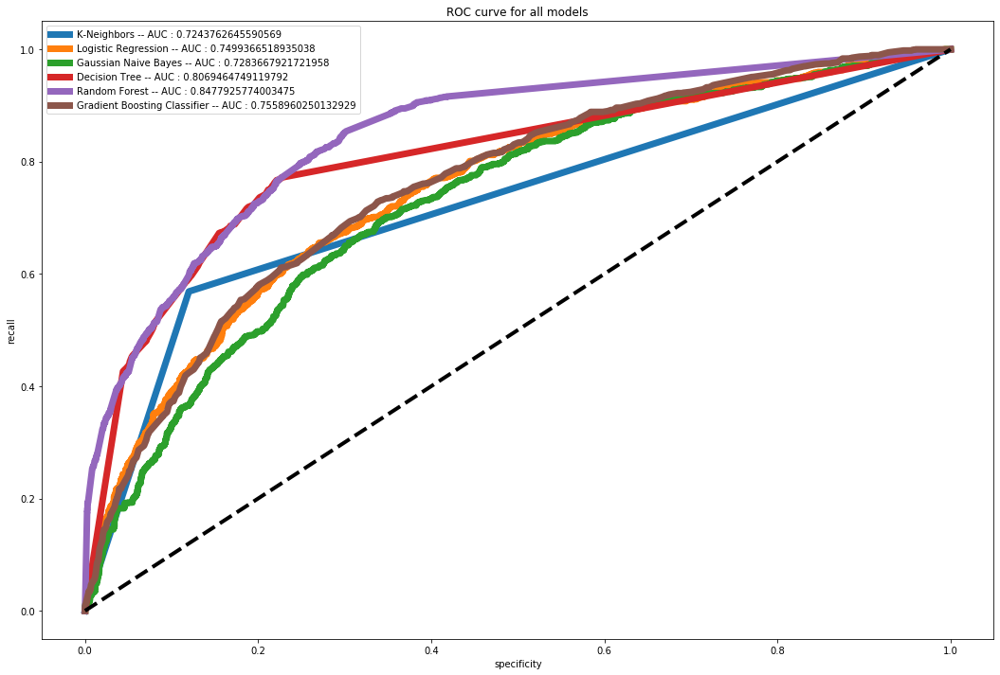

In [14]:
fig, ax = plt.subplots(figsize=(18, 12))

for i in range(len(auc_list)):
    plt.plot(specificity_list[i], recall_list[i], linewidth=7, \
             label= model_names[i] + ' -- AUC : ' + str(auc_list[i]))

plt.plot([0,1], [0,1], linestyle = '--', linewidth=4, color='black')
plt.xlabel('specificity')
plt.ylabel('recall')
plt.legend(loc=0);
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.title('ROC curve for all models')

In [33]:
from ipywidgets import interactive, FloatSlider

def make_confusion_matrix(model, threshold=0.5):
    # Predict class 1 if probability of being in class 1 is greater than threshold
    # (model.predict(X_test) does this automatically with a threshold of 0.5)
    y_predict = (model.predict_proba(x_test)[:, 1] >= threshold)
    y_predict = ['Pass' if i==1 else 'Fail' for i in y_predict]
    
    fraud_confusion = confusion_matrix(y_test, y_predict)
    plt.figure(dpi=150)
    sns.heatmap(fraud_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['Fail', 'Pass'],
           yticklabels=['Fail', 'Pass']);
    plt.xlabel('prediction')
    plt.ylabel('actual')
    

knn = models[0]
interactive(lambda threshold: make_confusion_matrix(knn, threshold), threshold=(0.0,1.0,0.02))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.02), Output()), _dom_cla…

In [24]:
for m in models:
    print(m)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
GaussianNB(priors=None, var_smoothing=1e-09)
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
RandomForestClassifier(bootstrap=True

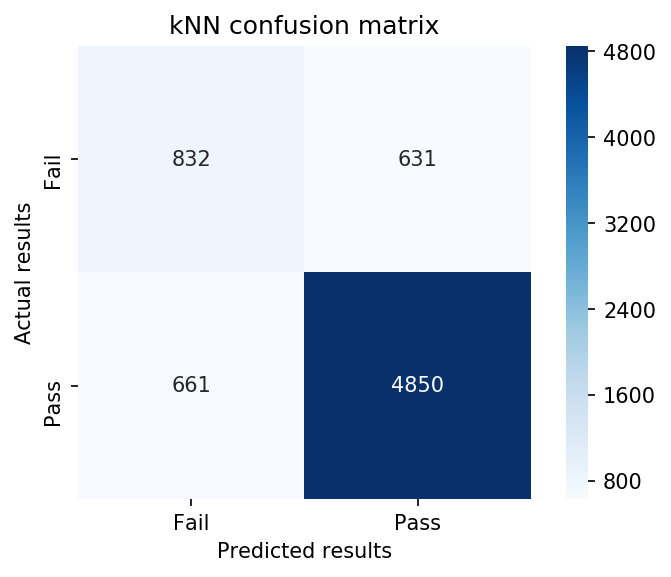

In [17]:
# Print confusion matrix for kNN
knn = models[0]
threshold = 0.79
y_predict = (knn.predict_proba(x_test)[:, 1] >= threshold)
y_predict = ['Pass' if i==1 else 'Fail' for i in y_predict]
knn_confusion = confusion_matrix(y_test, y_predict)
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
            xticklabels=['Fail', 'Pass'],
            yticklabels=['Fail', 'Pass'])
plt.xlabel('Predicted results')
plt.ylabel('Actual results')
plt.title('kNN confusion matrix');

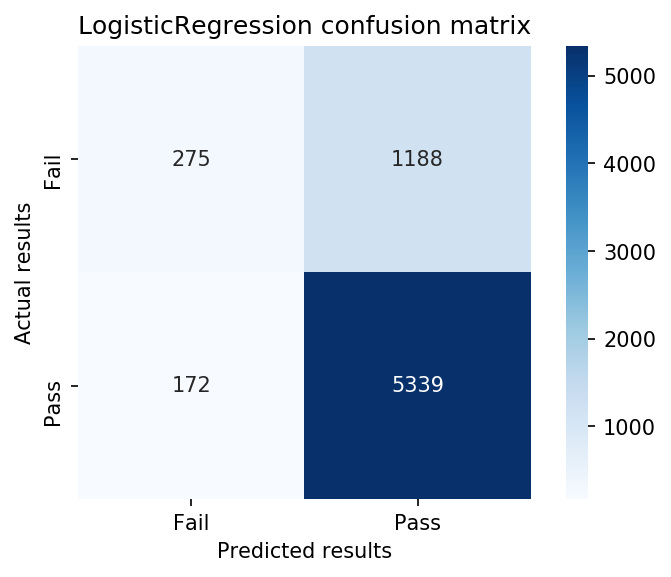

In [18]:
# Print confusion matrix for kNN
knn = models[1]
knn_confusion = confusion_matrix(y_test, knn.predict(x_test))
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
            xticklabels=['Fail', 'Pass'],
            yticklabels=['Fail', 'Pass'])
plt.xlabel('Predicted results')
plt.ylabel('Actual results')
plt.title('LogisticRegression confusion matrix');

In [25]:
models[4]

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

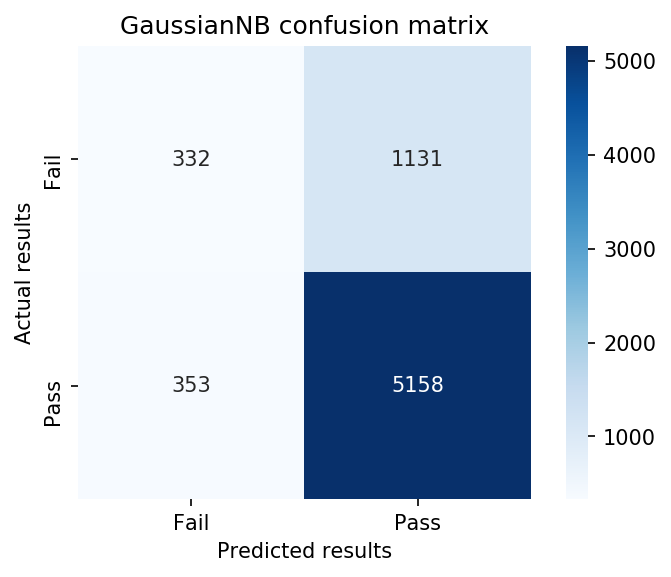

In [26]:
# Print confusion matrix for kNN
knn = models[2]
knn_confusion = confusion_matrix(y_test, knn.predict(x_test))
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
            xticklabels=['Fail', 'Pass'],
            yticklabels=['Fail', 'Pass'])
plt.xlabel('Predicted results')
plt.ylabel('Actual results')
plt.title('GaussianNB confusion matrix');

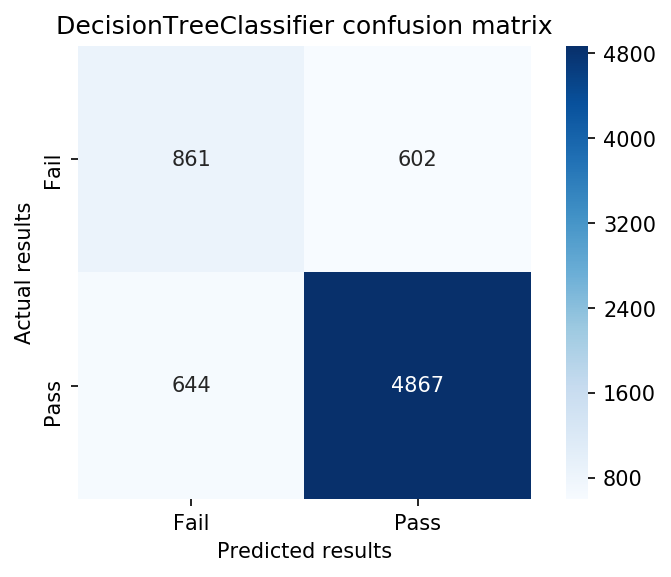

In [27]:

# Print confusion matrix for kNN
knn = models[3]
knn_confusion = confusion_matrix(y_test, knn.predict(x_test))
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
            xticklabels=['Fail', 'Pass'],
            yticklabels=['Fail', 'Pass'])
plt.xlabel('Predicted results')
plt.ylabel('Actual results')
plt.title('DecisionTreeClassifier confusion matrix');

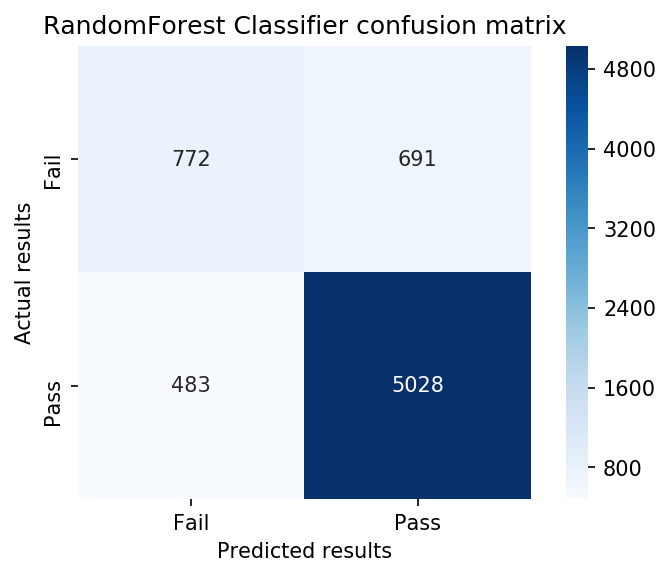

In [29]:
# Print confusion matrix for kNN
knn = models[4]
knn_confusion = confusion_matrix(y_test, knn.predict(x_test))
plt.figure(dpi=150)
sns.heatmap(knn_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
            xticklabels=['Fail', 'Pass'],
            yticklabels=['Fail', 'Pass'])
plt.xlabel('Predicted results')
plt.ylabel('Actual results')
plt.title('RandomForest Classifier confusion matrix');

In [34]:
knn = models[4]
interactive(lambda threshold: make_confusion_matrix(knn, threshold), threshold=(0.0,1.0,0.02))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.02), Output()), _dom_cla…

In [16]:
rf_model = models[4]
rf_model

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline

# Choose the type of classifier. 
pipeline_random_forest = make_pipeline(RandomForestClassifier(random_state=1))


# Choose some parameter combinations to try
param_grid = {'n_estimators': [4, 6, 9, 20], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1,5,8]
             }


    
# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(accuracy_score)

# Run the grid search
grid = GridSearchCV(RandomForestClassifier(), 
                    param_grid=param_grid, 
                    scoring=acc_scorer, 
                    cv=5)


grid = grid.fit(x_train, y_train)


# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)


# Set the best_model to the best combination of parameters
best_model = grid.best_estimator_

# Fit the best algorithm to the data. 
best_model.fit(x_train, y_train)


# Find accuracy on test dataset
y_predicted = best_model.predict(x_test)
acc = accuracy_score(y_test, y_predicted)
print('Accuracy of Random Forest is : ', acc)

# Save best model
#pickle.dump(best_model, open('./model/best_model_random_forest.p', 'wb'))

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/mod

0.8217687911007313
{'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 20}
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Accuracy of Random Forest is :  0.8273587611127043


In [18]:
best_model

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [15]:
best_model = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
best_model

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [21]:
from sklearn.metrics import log_loss

rf_model = best_model

print("Accuracy : {:6.4f}".format(accuracy_score(y_test, rf_model.predict(x_test))))
print("Log-loss on logit: {:6.4f}".format(log_loss(y_test, rf_model.predict_proba(x_test))))
print("Features Importances: {}".format(rf_model.feature_importances_))
print(x_test.iloc[0])

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


Accuracy : 0.8218
Log-loss on logit: 0.3996
Features Importances: [0.11762226 0.12277548 0.53503988 0.02433351 0.0757535  0.12447537]
latitude               41.948346
longitude             -87.688155
number violations       7.000000
price_level             2.000000
rating                  4.500000
user_ratings_total    129.000000
Name: 23012, dtype: float64


In [22]:
#f1_score(y_test, rf_model.predict(x_test))
#recall_score(y_test, rf_model.predict(x_test)) 
#precision_score(y_test, rf_model.predict(x_test)) 

## Visualization of Decision Tree


https://www.kaggle.com/niranjankumarc/attrition-data-visualization-imbalance-handling

In [23]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz

import pydotplus as pdot

In [26]:
dt = models[3]
dt.fit(x_train, y_train)

#write the dot data
dot_data = StringIO()



#export the decision tree along with the feature names into a dot file format
export_graphviz(dt, 
                out_file=dot_data,
                filled=True,rounded=True,
                special_characters=True,
                feature_names = x_train.columns.values,
                class_names = ["Fail","Pass"])



#make a graph from dot file 
graph = pdot.graph_from_dot_data(dot_data.getvalue())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.281903 to fit



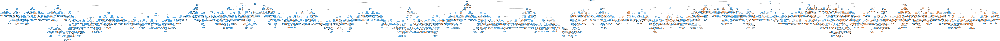

In [27]:
Image(graph.create_png())

In [28]:
#export the tree diagram
graph.write_png("decision_tree.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.281903 to fit



True

## Save model

In [48]:
import pickle

pickle.dump(models[5][0], open('./flask_app/my_pickled_model.p', 'wb'))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=1808090537, splitter='best')

In [42]:
models[5][0].predict(x_test)

array([1., 0., 1., ..., 0., 0., 1.])

In [43]:
x_test.iloc[0]

latitude               41.940455
longitude             -87.654271
number violations       3.000000
price_level             2.000000
rating                  4.000000
user_ratings_total    438.000000
Name: 11599, dtype: float64

In [45]:
models[5][0].predict(np.asarray(x_test.iloc[0]).reshape(1,-1))[0]

1.0

In [55]:
my_model = models[5][0]
input_df = np.asarray(x_test.iloc[0]).reshape(1,-1)
prediction = my_model.predict(input_df)[0]

In [56]:
my_model

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=1808090537, splitter='best')

In [57]:
input_df

array([[ 41.94045545, -87.65427085,   3.        ,   2.        ,
          4.        , 438.        ]])

In [58]:
prediction 

1.0

In [63]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
print(scaler.fit(x_train))
print(scaler.mean_)

StandardScaler(copy=True, with_mean=True, with_std=True)
[ 41.89261601 -87.6640327    5.15086478   1.21426887   3.85678066
 724.35585692]


In [64]:
print(scaler.fit_transform(x_train))

[[ 0.12782444  0.82911826 -0.99005796  2.96273748  0.57623603 -0.20616722]
 [-0.01584559  0.71392161 -0.99005796  2.96273748  0.57623603  0.08749351]
 [ 1.64026178 -0.49646289 -0.36162226  0.83565677  0.03871858 -0.19827535]
 ...
 [-1.55135814 -1.33650884 -0.67584011 -0.22788359 -0.31962639 -0.18830667]
 [ 0.79128673 -0.36482534 -0.67584011 -1.29142394 -3.45514486 -0.30086969]
 [-0.23701911  0.7392447   0.26681344  0.83565677  0.03871858  0.01937419]]


In [ ]:
from sklearn.preprocessing import StandardScaler

#x_train[['A', 'B']] = scaler.fit_transform(x_train[['A', 'B']])

scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [72]:
y = y.replace('Fail', 0)
y = y.replace('Pass', 1)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state=4444)

# Step

1. Model 
    - Scale
    - CV Train, Validation 
    - Test
  
2. Hyperameters 
    - Gridsearch 
    - RandomizedSearhCV
    

3. Change Threshold


4. Feature Engineering


5. Ensemble, Class Imbalance


6. Interpreter
    - feature importance
    
    - coefficents

In [35]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import log_loss

df_score = pd.DataFrame()

score_types = ['accuracy',  'f1', 'precision', 'recall', 'log_loss']


model_names = ['K-Neighbors', 
               'Logistic Regression', 
               'Gaussian Naive Bayes',
               'Decision Tree', 
               'Random Forest',
               'Gradient Boosting Classifier']


models = [KNeighborsClassifier(best_k),
          LogisticRegression(solver='lbfgs'),
          GaussianNB(),
          DecisionTreeClassifier(),
          RandomForestClassifier(n_estimators=10),
          GradientBoostingClassifier(n_estimators=10, learning_rate = best_learning_rate, 
                                     max_features=2, max_depth = 2, random_state = 0)]





for score_type in score_types:
    score_list = []
    for model in models:     
        model.fit(x_train, y_train)
        score = cross_val_score(model, x_train, y_train, scoring=score_type, cv=10)
        score_list.append(score.mean())
        
    df_score[score_type] = score_list
    , 
df_score = df_score.set_index([model_names])

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/ipykernel_launcher.py:32: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:514: DataConversionWarning: A colum

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed w

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/metrics/classification.py:1243: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if pos_label not in present_labels:


ValueError: pos_label=1 is not a valid label: array(['Fail', 'Pass'], dtype='<U4')

In [69]:
df_score

,accuracy,f1,precision,recall
K-Neighbors,0.809292,0.878397,0.875676,0.881211
Logistic Regression,0.796018,0.881053,0.809565,0.966431
Gaussian Naive Bayes,0.780039,0.869108,0.812487,0.934277
SVM,0.814885,0.890396,0.828909,0.961792
Decision Tree,0.815008,0.881185,0.883742,0.877594
Random Forest,0.825395,0.890361,0.875283,0.906997
Gradient Boosting Classifier,0.796203,0.879655,0.816900,0.952909


### Log Loss Cross-Entropy

In [ ]:
from sklearn.metrics import log_loss

print("Log-loss on logit: {:6.4f}".format(log_loss(y_test, lm.predict_proba(x_test))))

# Scale, Upsampling and CV 

In [139]:
y = y.replace('Fail', 0)
y = y.replace('Pass', 1)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state=4444)

In [140]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
x_train, y_train = ros.fit_sample(x_train,y_train)

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


https://stackoverflow.com/questions/49282889/using-sklearn-standardscaler-on-only-select-columns

In [141]:
scaler = StandardScaler()
x_subset = scaler.fit_transform(x_train[:,[2,3,4,5]])
x_first_2_column = x_train[:, [0,1]]
x_train = np.concatenate((x_first_2_column, x_subset), axis=1)

In [142]:
from sklearn.model_selection import cross_val_score

df_score = pd.DataFrame()

score_types = ['accuracy',  'f1', 'precision', 'recall']

model_names = ['K-Neighbors', 
               'Logistic Regression', 
               'Gaussian Naive Bayes',
               'SVM',
               'Decision Tree', 
               'Random Forest',
               'Gradient Boosting Classifier']


models = [KNeighborsClassifier(best_k),
          LogisticRegression(solver='lbfgs'),
          GaussianNB(),
          SVC(probability=True, gamma='auto'),
          DecisionTreeClassifier(),
          RandomForestClassifier(n_estimators=10),
          GradientBoostingClassifier(n_estimators=10, learning_rate = best_learning_rate, 
                                     max_features=2, max_depth = 2, random_state = 0)]





for score_type in score_types:
    score_list = []
    for model in models:     
        model.fit(x_train, y_train)
        score = cross_val_score(model, x_train, y_train, scoring=score_type, cv=10)
        score_list.append(score.mean())
        
    df_score[score_type] = score_list

df_score = df_score.set_index([model_names])

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ducvu/anaconda3

/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ducvu/anaconda3/envs/metis/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/Users/ducvu/anaconda3

KeyboardInterrupt: 

In [ ]:
df_score

# Scale and CV 

In [ ]:
y = y.replace('Fail', 0)
y = y.replace('Pass', 1)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.30, random_state=4444)

In [ ]:
scaler = StandardScaler()
x_subset = scaler.fit_transform(x_train[:,[2,3,4,5]])
x_first_2_column = x_train[:, [0,1]]
x_train = np.concatenate((x_first_2_column, x_subset), axis=1)

In [ ]:
from sklearn.model_selection import cross_val_score

df_score = pd.DataFrame()

score_types = ['accuracy',  'f1', 'precision', 'recall']
   
model_names = ['K-Neighbors', 
               'Logistic Regression', 
               'Gaussian Naive Bayes',
               'SVM RBF',
               'SVM Linear',
               'Decision Tree', 
               'Random Forest',
               'Gradient Boosting Classifier']


models = [KNeighborsClassifier(best_k),
          LogisticRegression(solver='lbfgs'),
          GaussianNB(),
          SVC(probability=True, kernel='rbf', gamma = auto),
          SVC(probability=True, kernel='linear'), 
          DecisionTreeClassifier(),
          RandomForestClassifier(n_estimators=10),
          GradientBoostingClassifier(n_estimators=10, learning_rate = best_learning_rate, 
                                     max_features=2, max_depth = 2, random_state = 0)]





for score_type in score_types:
    score_list = []
    for model in models:     
        model.fit(x_train, y_train)
        score = cross_val_score(model, x_train, y_train, scoring=score_type, cv=10)
        score_list.append(score.mean())
        
    df_score[score_type] = score_list

df_score = df_score.set_index([model_names])

# I. Predictions

# II. Model Selection

# III. Hyperparameters

1. Oversampling the minority class

2. SMOTE - Synthetic Minority Oversampling TEchnique

3. ADASYN (ADAptive SYNthetic oversampling)

4. Undersampling the majority class



## GridSearchCV for  optimizing parameters in KNN (Searching multiple parameters simultaneously)

In [163]:
# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(accuracy_score)

# create a parameter grid: map the parameter names to the values that should be searched
param_grid = dict(n_neighbors=np.arange(1,31), weights = ['uniform', 'distance'])


# instantiate and fit the grid
grid = GridSearchCV(KNeighborsClassifier(2), 
                    param_grid=param_grid, 
                    scoring=acc_scorer, 
                    cv=5)  #scoring='accuracy'

grid.fit(x_train, y_train)


# view the complete results
grid.cv_results_

# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)

# Set the best_model to the best combination of parameters
best_model = grid.best_estimator_

# Fit the best algorithm to the data. 
best_model.fit(x_train, y_train)


# Find accuracy on test dataset
y_predicted = best_model.predict(x_test)
acc = accuracy_score(y_test, y_predicted)
print('Accuracy of KNN is : ', acc)

# Save best model
pickle.dump(best_model, open('./model/best_model_knn.p', 'wb'))

0.8671383647798742
{'n_neighbors': 2, 'weights': 'distance'}
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                     weights='distance')
Accuracy of KNN is :  0.2304273014052194


## GridSearchCV for  optimizing parameters in Logistic Regression 

In [ ]:
# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(accuracy_score)


# create a parameter grid: map the parameter names to the values that should be searched
# Create regularization hyperparameter and regularization penalty space
param_grid = dict(C=np.logspace(0, 4, 10), penalty=['l1', 'l2'])# l1 lasso l2 ridge

# instantiate and fit the grid
grid = GridSearchCV(LogisticRegression(), 
                    param_grid=param_grid, 
                    scoring=acc_scorer, 
                    cv=5)  #scoring='accuracy'

grid.fit(x_train, y_train)


# view the complete results
grid.cv_results_

# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)

# Set the best_model to the best combination of parameters
best_model = grid.best_estimator_

# Fit the best algorithm to the data. 
best_model.fit(x_train, y_train)


# Find accuracy on test dataset
y_predicted = best_model.predict(x_test)
acc = accuracy_score(y_test, y_predicted)
print('Accuracy of Logistic Regression is : ', acc)

# Save best model
pickle.dump(best_model, open('./model/best_model_logreg.p', 'wb'))

## GridSearchCV for  optimizing parameters in SVM

In [ ]:
# Set the parameters by cross-validation
param_grid = [{'kernel': ['rbf'], 'gamma': [1,1e-1,1e-2,1e-3, 1e-4], 'C': [1, 10, 100, 1000]},
              {'kernel': ['linear'], 'C': [1, 10, 100, 1000]},
              {'kernel':['poly'],'degree':[1,2,3]}]


    
grid = GridSearchCV(SVC(C=1), 
                    param_grid=param_grid, 
                    scoring=acc_scorer, 
                    cv=5)


grid = grid.fit(x_train, y_train)


# view the complete results
grid.cv_results_


# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)


# Set the best_model to the best combination of parameters
best_model = grid.best_estimator_

# Fit the best algorithm to the data. 
best_model.fit(x_train, y_train)


# Find accuracy on test dataset
y_predicted = best_model.predict(x_test)
acc = accuracy_score(y_test, y_predicted)
print('Accuracy of SVM is : ', acc)

# Save best model
pickle.dump(best_model, open('./model/best_model_svm.p', 'wb'))

## GridSearchCV for  optimizing parameters in Random Forest

In [144]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline

# Choose the type of classifier. 
pipeline_random_forest = make_pipeline(RandomForestClassifier(random_state=1))


# Choose some parameter combinations to try
param_grid = {'n_estimators': [4, 6, 9, 20], 
              'max_features': ['log2', 'sqrt','auto'], 
              'criterion': ['entropy', 'gini'],
              'max_depth': [2, 3, 5, 10], 
              'min_samples_split': [2, 3, 5],
              'min_samples_leaf': [1,5,8]
             }


    
# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(accuracy_score)

# Run the grid search
grid = GridSearchCV(RandomForestClassifier(), 
                    param_grid=param_grid, 
                    scoring=acc_scorer, 
                    cv=5)


grid = grid.fit(x_train, y_train)


# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)


# Set the best_model to the best combination of parameters
best_model = grid.best_estimator_

# Fit the best algorithm to the data. 
best_model.fit(x_train, y_train)


# Find accuracy on test dataset
y_predicted = best_model.predict(x_test)
acc = accuracy_score(y_test, y_predicted)
print('Accuracy of Random Forest is : ', acc)

# Save best model
pickle.dump(best_model, open('./model/best_model_random_forest.p', 'wb'))

KeyboardInterrupt: 

## GridSearchCV for  optimizing parameters in Decision Tree

In [161]:
# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(accuracy_score)

param_grid = [{'min_samples_split' : np.arange(2, 21),
              'min_samples_leaf':[1, 5, 10, 20, 50, 100]}]

DecisionTreeClassifier(max_depth=4)
grid = GridSearchCV(DecisionTreeClassifier(min_samples_split=4, random_state=0) , 
                    param_grid=param_grid, 
                    scoring=acc_scorer, 
                    cv=5)

grid = grid.fit(x_train, y_train)


# examine the best model
print(grid.best_score_)
print(grid.best_params_)
print(grid.best_estimator_)


# Set the best_model to the best combination of parameters
best_model = grid.best_estimator_

# Fit the best algorithm to the data. 
best_model.fit(x_train, y_train)


# Find accuracy on test dataset
y_predicted = best_model.predict(x_test)
acc = accuracy_score(y_test, y_predicted)
print('Accuracy of decision tree is : ', acc)

# Save best model
pickle.dump(best_model, open('./model/best_model_decision_tree.p', 'wb'))

0.870125786163522
{'min_samples_leaf': 1, 'min_samples_split': 2}
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')
Accuracy of decision tree is :  0.564238600516203


### Intuition

It's simply asking a series of questions

- You'll have decision nodes

- Pick a feature and ask a question (is good rating?)

- As you can see here, you can continue to ask more questions with more nodes down the tree.


- Decision Trees: Learning
    - Pick best features
    - Ask question
    - Follow the answer path
    - Go to (1)
        - Repeat until you get an answer





### Choosing Best Features: Information Gain

Goal is to minimize entropy for maximum information gain

- If all samples went to left side of tree
    - No entropy gain in using that attribute
    
    - Entropy constant

- If all samples went to each side of the tree with no clear split (all mixed up)
    - No entropy gain

    - Entropy constant
    
    
- If samples split into each side of the tree distinctly

    - Max entropy gain
    
    - Entropy fell

    
### Entropy

- Controls how a Decision Tree decides where to split the data

- Definition : 
    - Measure of impurity in a bunch of examples

- Concept : 
    - Find variables and Split such that the sets contain the least impurities
    - Repeat the process until sets are pure

- Values Entropy can hold values between 0 and 1.0
    - All examples same class : Entropy = 0
    - All examples are evenly split amongst classes : Entropy = 1.0



### Information gain

- Formula
    - information gain = entropy(parent) - [weighted average]entropy(children)
    
    - weight = number of examples in set / total number of examples

- Decision tree algorithm: maximizing information gain



### Dealing with overfitting: min_samples_split

- default `min_samples_split=2` (i.e if you've 1 sample left in a node, you cannot split further)

- When it gets really deep in depth, it overfits your data

- If you increase your `min_samples_split` value, you would decrease the depth of your tree

- This is because you would run out of samples to split. This would reduce overfitting




### Summary 

- Prone to overfitting
    - If you have a lot of features
    - Stop growth of tree at the appropriate time

- You can build bigger classifiers out of this, called `ensemble classifiers`
    

### Linear Decision Boundary

- Decision tree is having a hard time because it can only subdivide the space into rectanuglar regions.

- Linear SVC makes any linear decision boundary.


### Quadrant decision boundary
different categorization - quadrant-style decision boundary.

- Decision trees thrive on this data and are able to segment according to the quadrants to make local predicitons 

- SVCs struggles because the data isn't linearly seperable, so it only make global decisions.


***Sophistications like non-linear kernels and random forests helped***

## RandomizedSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
# specify "parameter distributions" rather than a "parameter grid"
param_dist = dict(n_neighbors=k_range, weights=weight_options)


# n_iter controls the number of searches
rand = RandomizedSearchCV(knn, param_dist, cv=10, scoring='accuracy', n_iter=10, random_state=42)
rand.fit(X, y)
rand.cv_results_

In [ ]:
# examine the best model
print(rand.best_score_)
print(rand.best_params_)

In [ ]:
# run RandomizedSearchCV 20 times (with n_iter=10) and record the best score
best_scores = []
for _ in range(20):
    rand = RandomizedSearchCV(knn, param_dist, cv=10, scoring='accuracy', n_iter=10)
    rand.fit(X, y)
    best_scores.append(round(rand.best_score_, 3))
print(best_scores)

## Prediction

In [ ]:
predictions = clf.predict(X_test)
print(accuracy_score(y_test, predictions))

In [ ]:
actual_result = y_test['Results']
predictions = clf.predict(x_test)

output = pd.DataFrame({ 'Actual Resutls' : actual_result, 'Predicted Results': predictions })
output.head()

# Outline 

### 1. Question

- Predict

- Interpret



### 2. Model

- EDA

- Dummy

- Train/Test CV



### 3.Hyperparameters

- GridSearchCV

- RandomizeGridSearchCV


- Feature Engineering

    - PCA

    - More data


- Threshold


- Ensembling


- Scaling


- Class Imbalance


- ROC-AUC

    - Accuracy
    
    - Precision
    
    - Recall
    
    - F1
    
    - log_loss
    
    
### 4. Interpret

- Logistic

- Decision tree/ Random Forest

- Predict

    - Model
    
    - Data



### 5. Communication

- example predictions

- confusion matrix

- cost-benefit analysis

- feature importance

- coefficients

- extremes
